# 1. Import Libraries

In [1]:
import os
import io
import random
from collections import Counter, defaultdict

import numpy as np
from tqdm import tqdm
from PIL import Image
from skimage.io import imread
import imagesize
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

In [2]:
import tensorflow as tf
from tensorflow import GradientTape
from tensorflow.data import Dataset
from tensorflow.keras import Sequential, layers, models
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam

2025-08-31 04:51:41.741414: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756615901.924869      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756615901.973776      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
import warnings
warnings.filterwarnings("ignore")

# 2. Dataset Preparation

## 2-1. Extract Image Paths

In [4]:
data_dir = '/kaggle/input/animefacedataset/images'

In [5]:
image_paths = []
    
for file in os.listdir(data_dir):
    
    if file.endswith(".png") or file.endswith(".jpg"): 
        image_paths.append(
            os.path.join(data_dir, file)
        )

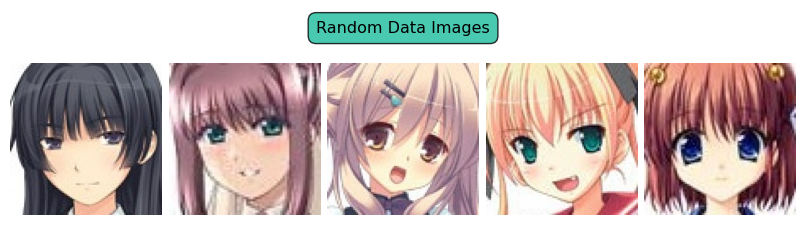

In [6]:
fig = plt.figure(figsize=(8, 2.5))
gs = GridSpec(2, 5, height_ratios=[0.15, 0.85])

title_ax = fig.add_subplot(gs[0, :])
title_ax.text(0.5, 0.5, "Random Data Images",
              fontsize=11.5, ha='center', va='center',
              bbox=dict(facecolor='#1ABC9C', edgecolor='black', 
                        boxstyle='round,pad=0.5', alpha=0.8))
title_ax.axis('off')

for j in range(5):
    ax = fig.add_subplot(gs[1, j])
    random_img = random.choice(image_paths)
    img = imread(random_img)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout(pad=0.5)
plt.show()

## 2-2. Check image dimensions

In [7]:
sizes = []

print("Processing images to get their dimensions...")

for img_path in tqdm(image_paths):
    width, height = imagesize.get(img_path)
    sizes.append(width)

Processing images to get their dimensions...


100%|██████████| 63565/63565 [08:27<00:00, 125.17it/s]


In [8]:
size_counts = Counter(sizes)
bin_size = 10
binned_counts = defaultdict(int)

for size, count in size_counts.items():
    bin_start = ((size - 1) // bin_size) * bin_size + 1
    bin_end = bin_start + bin_size - 1
    bin_label = f"{bin_start}-{bin_end}"
    binned_counts[bin_label] += count

sorted_bins = sorted(binned_counts.items(), key=lambda item: int(item[0].split('-')[0]))

labels = [item[0] for item in sorted_bins]
counts = [item[1] for item in sorted_bins]

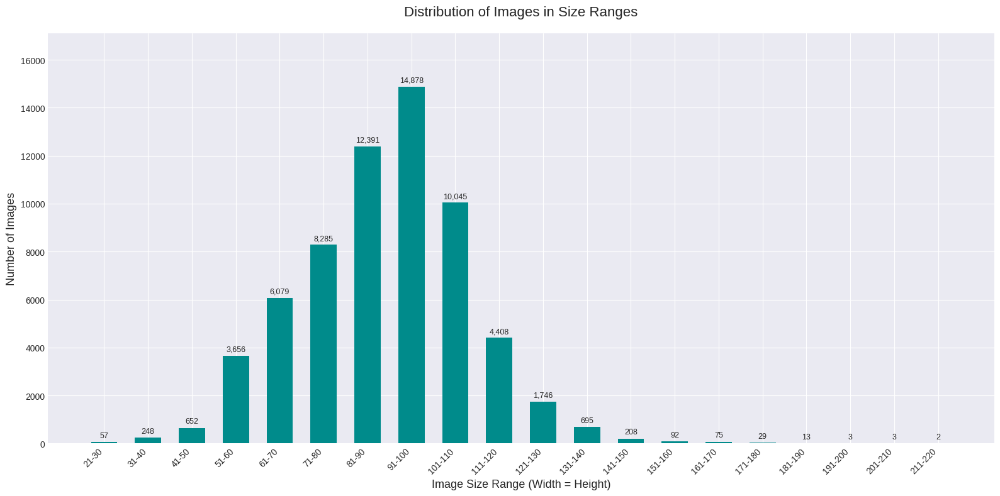

In [9]:
plt.style.use('seaborn-v0_8-darkgrid')
fig, ax = plt.subplots(figsize=(16, 8)) 

bars = ax.bar(labels, counts, color='darkcyan', width=0.6)

ax.set_title('Distribution of Images in Size Ranges', fontsize=16, pad=20)
ax.set_ylabel('Number of Images', fontsize=13)
ax.set_xlabel('Image Size Range (Width = Height)', fontsize=13)

plt.xticks(rotation=45, ha="right")

for bar in bars:
    height = bar.get_height()
    ax.annotate(f'{height:,}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom', fontsize=9)

ax.set_ylim(top=max(counts) * 1.15)

plt.tight_layout()
plt.show()

In [10]:
filtered_image_paths = []

for img_path in image_paths:
    width, height = imagesize.get(img_path)
    if width > 50:
        filtered_image_paths.append(img_path)

<div class="alert alert-info" style="display: inline-block; padding: 8px 12px; margin: 0;">
Images with an image size (width = height) of <b>50 pixels or less</b> were <b>filtered out</b>.
</div>

## 2-3. Create Dataset

In [11]:
def load_images(image_paths, target_size):
    
    images = []
    
    for image_path in image_paths:
        image = Image.open(image_path).convert("RGB").resize(target_size)
        rescaled_image = np.array(image) / 127.5 - 1.0
        images.append(rescaled_image)

    images = np.array(images, dtype=np.float32)
    
    return images

In [12]:
def create_dataset(image_paths, target_size, batch_size, seed=42):
    
    images = load_images(image_paths, target_size)
    print(f"Number of Images: {images.shape[0]}")
    
    dataset = Dataset.from_tensor_slices(images)
    dataset = dataset.shuffle(seed)
    dataset = dataset.batch(batch_size)
        
    return dataset

In [13]:
img_height, img_width = (64, 64)
batch_size = 64

In [14]:
dataset = create_dataset(
    image_paths = filtered_image_paths, 
    target_size = (img_height, img_width),
    batch_size = batch_size,
    seed = 42
)

Number of Images: 62608


I0000 00:00:1756616602.175649      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


# 3. Modeling

## 3-1. Build Model

In [15]:
# This model is based on the DCGAN architecture.

In [16]:
def build_generator_model(latent_dim=100):
    
    # Input layer: latent vector (noise)
    inp = layers.Input(shape=(latent_dim,))

    # Hidden Layers
    x = Sequential([
        layers.Dense(512*8*8, use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Reshape((8, 8, 512)),
        layers.Conv2DTranspose(256, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2DTranspose(128, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU()
    ])(inp)
    
    # Output layer: tanh for [-1, 1] normalized images
    out = layers.Conv2DTranspose(3, kernel_size=5, strides=1, padding="same", use_bias=False, activation="tanh")(x)
    
    model = models.Model(inputs=inp, outputs=out)
    return model

In [17]:
def build_discriminator_model():

    # Input Layer
    inp = layers.Input(shape=(64, 64, 3))
    
    # Hidden Layers
    x = Sequential([
        layers.Conv2D(64, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.LeakyReLU(alpha=0.2),
        layers.SpatialDropout2D(0.3),
        layers.Conv2D(128, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.LeakyReLU(alpha=0.2),
        layers.SpatialDropout2D(0.3),
        layers.Conv2D(256, kernel_size=5, strides=2, padding="same", use_bias=False),
        layers.LeakyReLU(alpha=0.2),
        layers.SpatialDropout2D(0.3),
        layers.Flatten(),
        layers.Dense(512, use_bias=False),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.3)
    ])(inp)
    
    # Output Layer: sigmoid for binary classification real/fake
    out = layers.Dense(1, activation='sigmoid')(x)
    
    model = models.Model(inputs=inp, outputs=out)
    return model

In [18]:
generator_model = build_generator_model()

discriminator_model = build_discriminator_model()

## 3-2. Model Training

In [19]:
@tf.function
def process_batch(generator_model, discriminator_model, batch, latent_dim,
                  loss_function, g_optimizer, d_optimizer):

    batch_size = batch.shape[0]
    noise = tf.random.normal([batch_size, latent_dim])

    with GradientTape() as g_tape, GradientTape() as d_tape:
        images = batch
        generated_images = generator_model(noise, training=True)

        real_output = discriminator_model(images, training=True)
        fake_output = discriminator_model(generated_images, training=True)
        
        fake_labels = tf.zeros((batch_size, 1))
        real_labels = tf.ones((batch_size, 1))
        
        g_loss = loss_function(real_labels, fake_output)
        d_loss = (
            loss_function(fake_labels, fake_output) +
            loss_function(real_labels, real_output)
        )

    g_optimizer.apply_gradients(zip(
        g_tape.gradient(g_loss, generator_model.trainable_variables), 
        generator_model.trainable_variables
    ))
    d_optimizer.apply_gradients(zip(
        d_tape.gradient(d_loss, discriminator_model.trainable_variables), 
        discriminator_model.trainable_variables
    ))

    return g_loss, d_loss

In [20]:
def plot_images(gen_imgs):

    gen_imgs = ((gen_imgs + 1) * 127.5).astype(np.uint8)

    fig, axs = plt.subplots(1, 5, figsize=(9, 3))
    for i in range(5):
        axs[i].imshow(gen_imgs[i])
        axs[i].axis('off')  
    plt.subplots_adjust(wspace=0.05)        
    plt.show()

In [21]:
def train_gan(generator_model, discriminator_model, dataset, epochs, 
              loss_function, g_optimizer, d_optimizer):
    
    history = []
    latent_dim = generator_model.input_shape[1]
    fixed_noise = tf.random.normal([5, latent_dim])
    
    for epoch in range(epochs):
        epoch_label = f"{epoch + 1}/{epochs}"
        g_losses = []
        d_losses = []
        
        for batch in tqdm(dataset, desc = f"Epoch {epoch_label} | Batches"):
            g_loss, d_loss = process_batch(
                generator_model, discriminator_model, batch, latent_dim,
                loss_function, g_optimizer, d_optimizer
            )
            g_losses.append(g_loss)
            d_losses.append(d_loss)
            
        report = {
            "epoch":    epoch_label,
            "g_loss": float(tf.reduce_mean(g_losses)),
            "d_loss": float(tf.reduce_mean(d_losses)),
            "gen_imgs": generator_model.predict(fixed_noise, verbose=0)
        }
        history.append(report)
        
        print(f"Epoch {report['epoch']} | G Loss: {report['g_loss']:.4f} | D Loss: {report['d_loss']:.4f}")
        plot_images(report['gen_imgs'])
        print()
        
    return history

Epoch 1/50 | Batches:   0%|          | 0/979 [00:00<?, ?it/s]E0000 00:00:1756616621.394101      19 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_3_1/sequential_1_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1756616621.706041      62 cuda_dnn.cc:529] Loaded cuDNN version 90300
Epoch 1/50 | Batches: 100%|█████████▉| 977/979 [01:37<00:00, 11.26it/s]E0000 00:00:1756616713.127899      19 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_3_1/sequential_1_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
Epoch 1/50 | Batches: 100%|██████████| 979/979 [01:39<00:00,  9.81it/s]
I0000 00:00:1756616714.103187      60 service.cc:148] XLA service 0x1728c7670 initialized for platform CUDA (this does not guarantee that XLA will be used).

Epoch 1/50 | G Loss: 0.9893 | D Loss: 1.2317


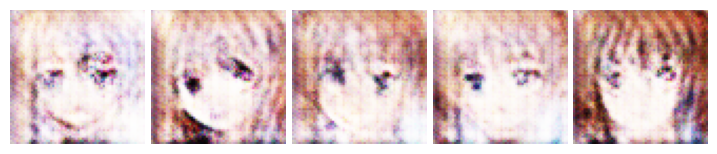

Epoch 2/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 2/50 | G Loss: 0.8160 | D Loss: 1.2679


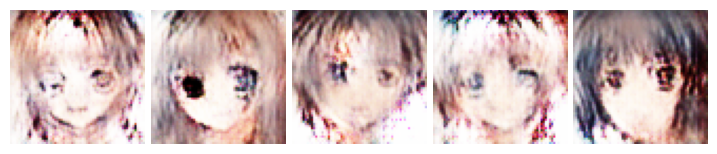

Epoch 3/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 3/50 | G Loss: 0.8055 | D Loss: 1.2450


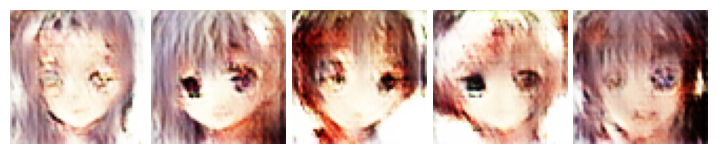

Epoch 4/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 4/50 | G Loss: 0.8386 | D Loss: 1.2300


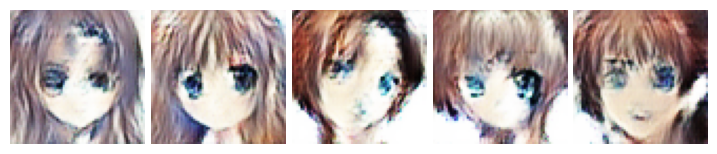

Epoch 5/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 5/50 | G Loss: 0.7768 | D Loss: 1.2874


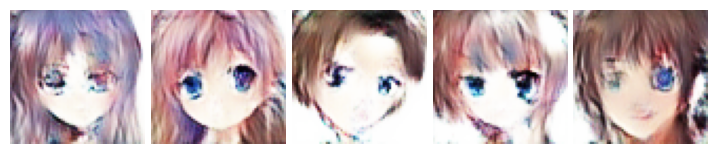

Epoch 6/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 6/50 | G Loss: 0.7624 | D Loss: 1.3112


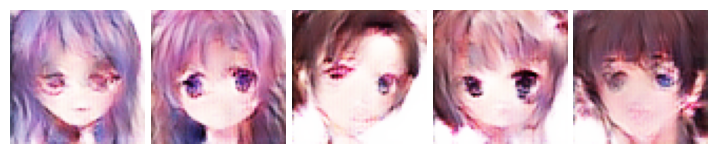

Epoch 7/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 7/50 | G Loss: 0.7691 | D Loss: 1.3107


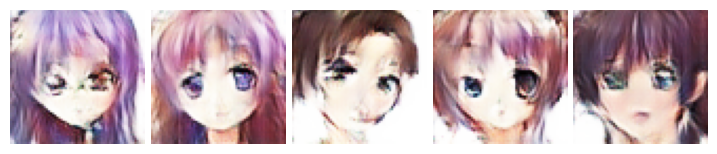

Epoch 8/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 8/50 | G Loss: 0.7670 | D Loss: 1.3147


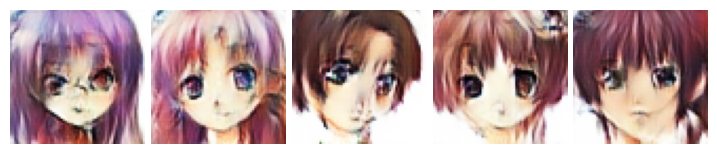

Epoch 9/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 9/50 | G Loss: 0.7689 | D Loss: 1.3156


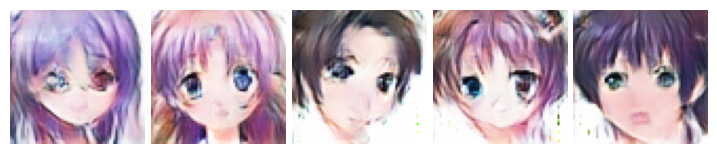

Epoch 10/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 10/50 | G Loss: 0.7661 | D Loss: 1.3178


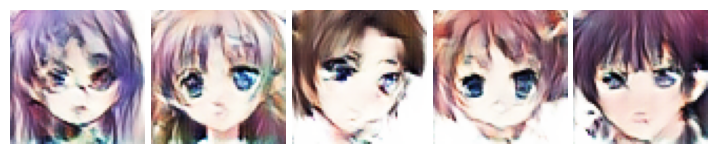

Epoch 11/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 11/50 | G Loss: 0.7691 | D Loss: 1.3169


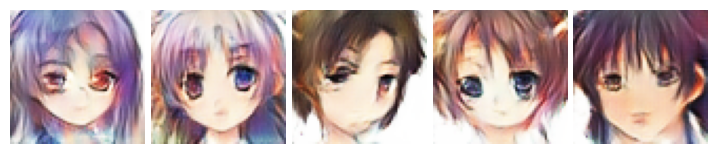

Epoch 12/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 12/50 | G Loss: 0.7781 | D Loss: 1.3132


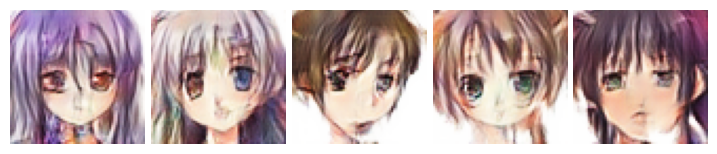

Epoch 13/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 13/50 | G Loss: 0.7778 | D Loss: 1.3130


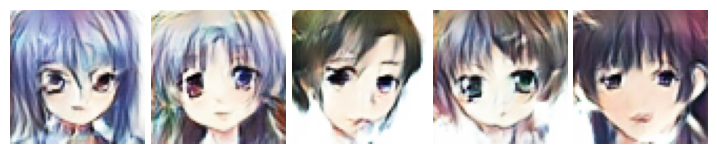

Epoch 14/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 14/50 | G Loss: 0.7832 | D Loss: 1.3076


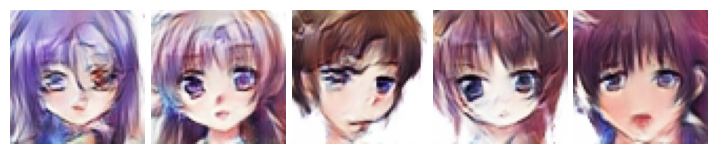

Epoch 15/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 15/50 | G Loss: 0.7914 | D Loss: 1.3028


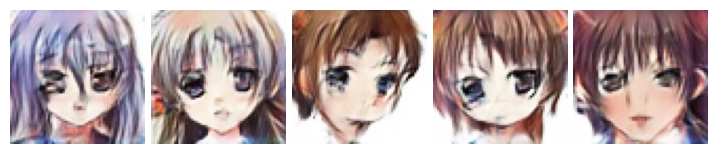

Epoch 16/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 16/50 | G Loss: 0.7971 | D Loss: 1.3001


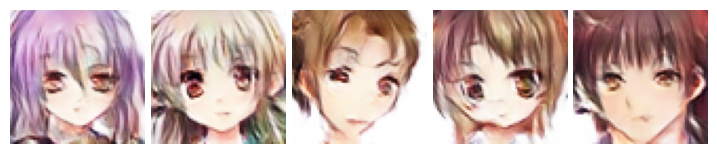

Epoch 17/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 17/50 | G Loss: 0.8048 | D Loss: 1.2913


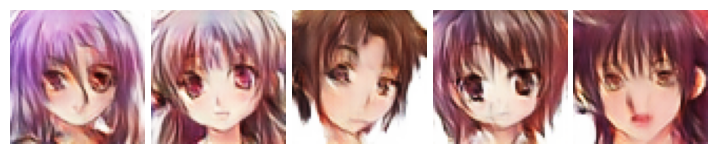

Epoch 18/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 18/50 | G Loss: 0.8095 | D Loss: 1.2864


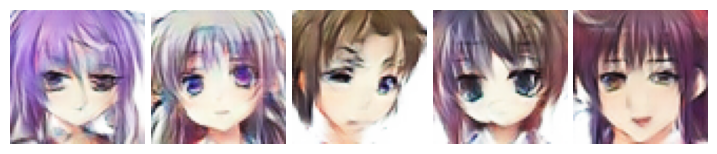

Epoch 19/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 19/50 | G Loss: 0.8187 | D Loss: 1.2770


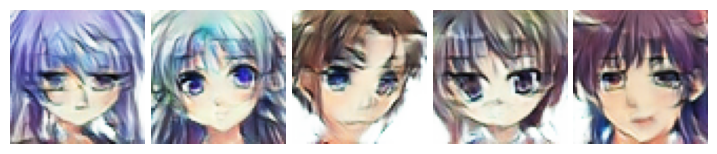

Epoch 20/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 20/50 | G Loss: 0.8293 | D Loss: 1.2673


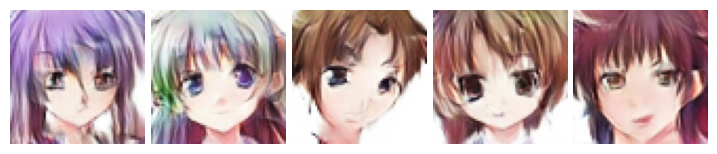

Epoch 21/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 21/50 | G Loss: 0.8365 | D Loss: 1.2625


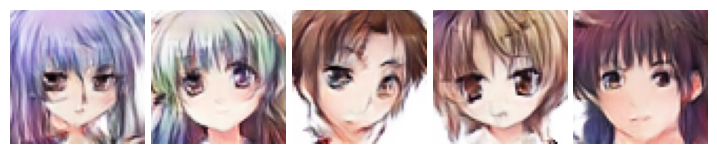

Epoch 22/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 22/50 | G Loss: 0.8482 | D Loss: 1.2529


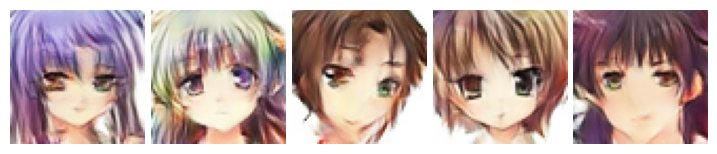

Epoch 23/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 23/50 | G Loss: 0.8584 | D Loss: 1.2440


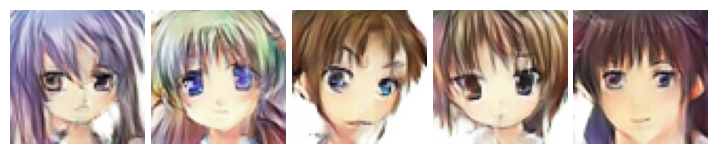

Epoch 24/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 24/50 | G Loss: 0.8683 | D Loss: 1.2316


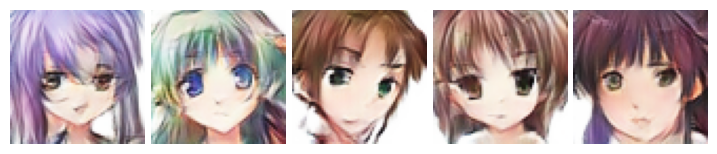

Epoch 25/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 25/50 | G Loss: 0.8808 | D Loss: 1.2243


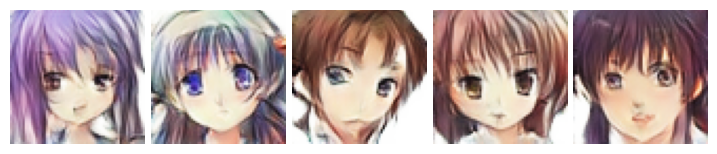

Epoch 26/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 26/50 | G Loss: 0.8965 | D Loss: 1.2076


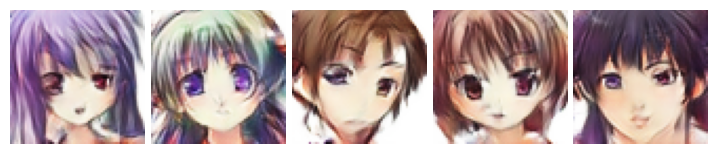

Epoch 27/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 27/50 | G Loss: 0.9109 | D Loss: 1.1942


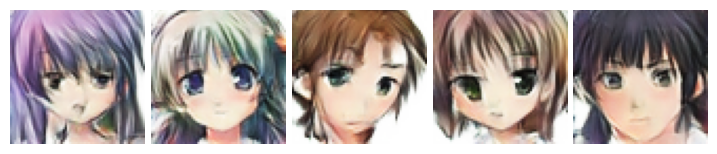

Epoch 28/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 28/50 | G Loss: 0.9195 | D Loss: 1.1913


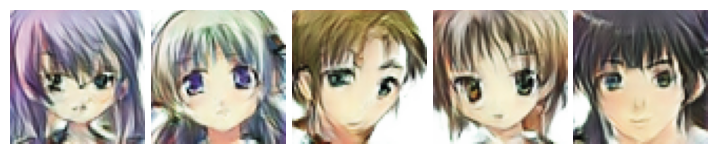

Epoch 29/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 29/50 | G Loss: 0.9260 | D Loss: 1.1827


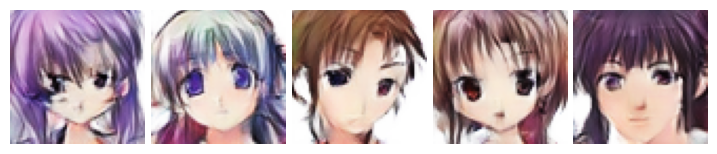

Epoch 30/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 30/50 | G Loss: 0.9472 | D Loss: 1.1663


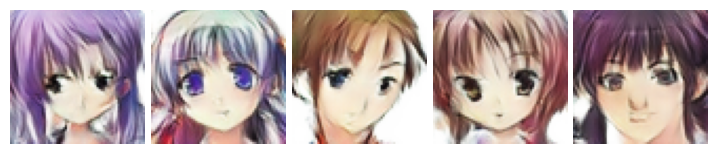

Epoch 31/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 31/50 | G Loss: 0.9605 | D Loss: 1.1533


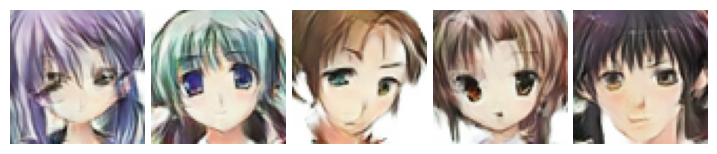

Epoch 32/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 32/50 | G Loss: 0.9721 | D Loss: 1.1476


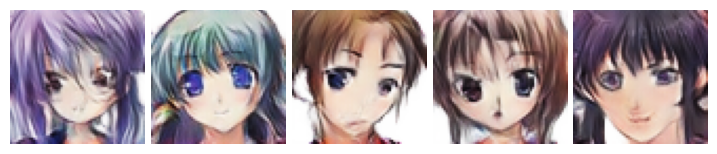

Epoch 33/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 33/50 | G Loss: 0.9790 | D Loss: 1.1401


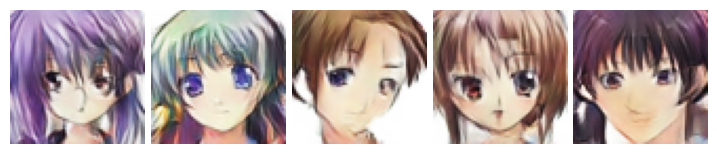

Epoch 34/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 34/50 | G Loss: 0.9883 | D Loss: 1.1348


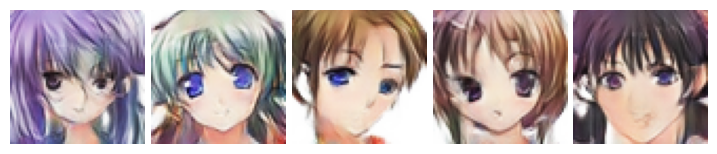

Epoch 35/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 35/50 | G Loss: 1.0019 | D Loss: 1.1276


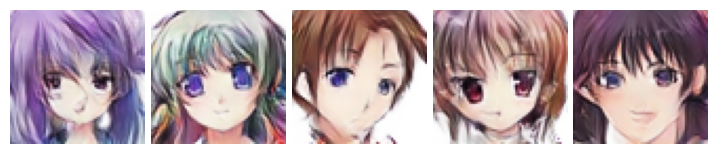

Epoch 36/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 36/50 | G Loss: 1.0158 | D Loss: 1.1141


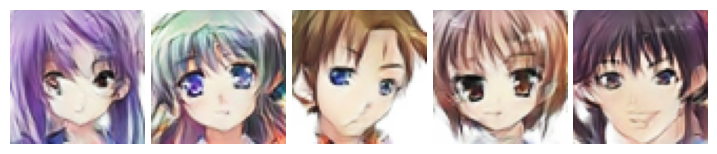

Epoch 37/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 37/50 | G Loss: 1.0329 | D Loss: 1.0987


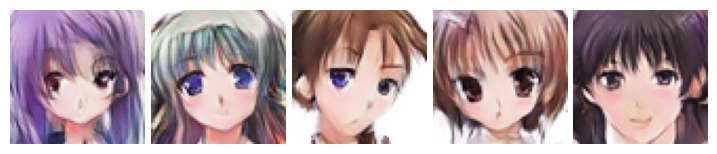

Epoch 38/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 38/50 | G Loss: 1.0416 | D Loss: 1.0942


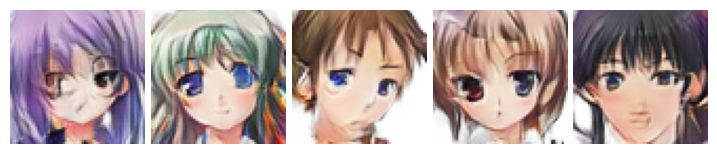

Epoch 39/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 39/50 | G Loss: 1.0537 | D Loss: 1.0879


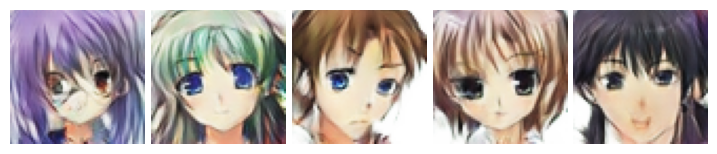

Epoch 40/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 40/50 | G Loss: 1.0597 | D Loss: 1.0861


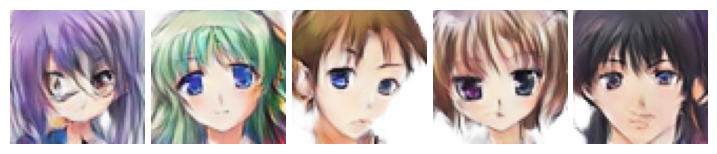

Epoch 41/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 41/50 | G Loss: 1.0696 | D Loss: 1.0795


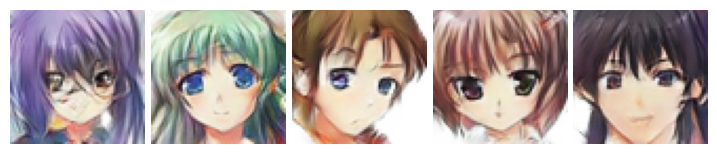

Epoch 42/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 42/50 | G Loss: 1.0782 | D Loss: 1.0738


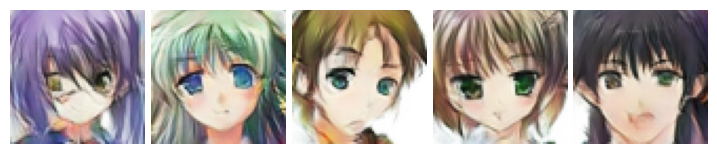

Epoch 43/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 43/50 | G Loss: 1.0932 | D Loss: 1.0607


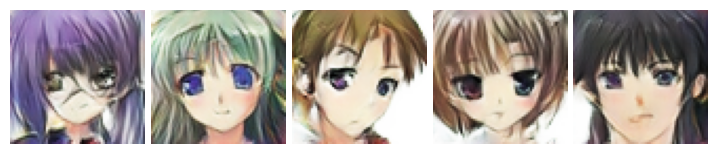

Epoch 44/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 44/50 | G Loss: 1.1084 | D Loss: 1.0578


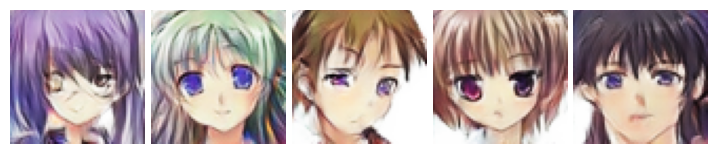

Epoch 45/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 45/50 | G Loss: 1.1143 | D Loss: 1.0497


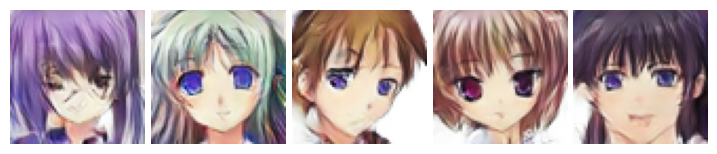

Epoch 46/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 46/50 | G Loss: 1.1302 | D Loss: 1.0413


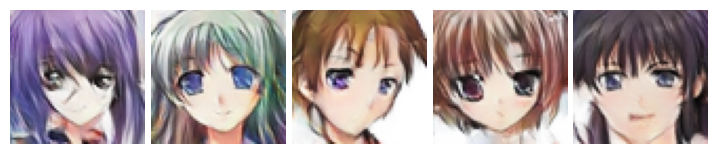

Epoch 47/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.24it/s]


Epoch 47/50 | G Loss: 1.1412 | D Loss: 1.0364


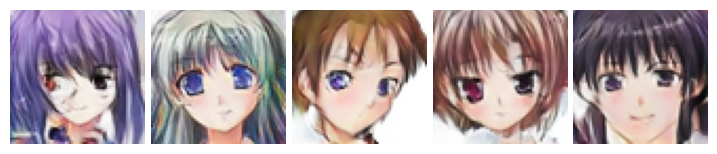

Epoch 48/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 48/50 | G Loss: 1.1542 | D Loss: 1.0260


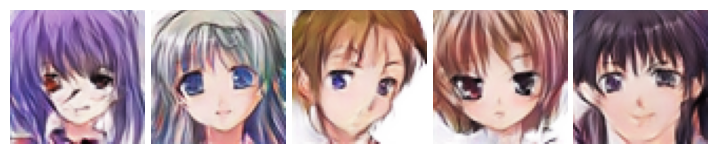

Epoch 49/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 49/50 | G Loss: 1.1587 | D Loss: 1.0281


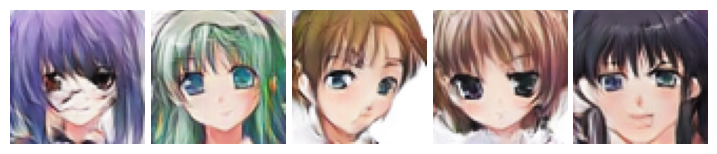

Epoch 50/50 | Batches: 100%|██████████| 979/979 [01:27<00:00, 11.25it/s]


Epoch 50/50 | G Loss: 1.1676 | D Loss: 1.0201


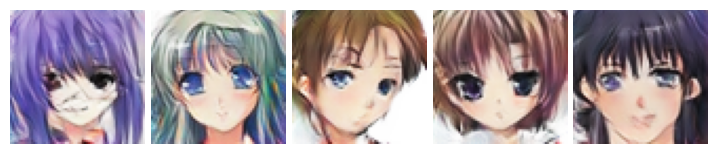

In [22]:
history = train_gan(
    generator_model, 
    discriminator_model, 
    dataset, 
    epochs = 50, 
    loss_function = BinaryCrossentropy(), 
    g_optimizer = Adam(2e-4, beta_1=0.5), 
    d_optimizer = Adam(1e-4, beta_1=0.5)
)

## 3-3. Loss Analysis

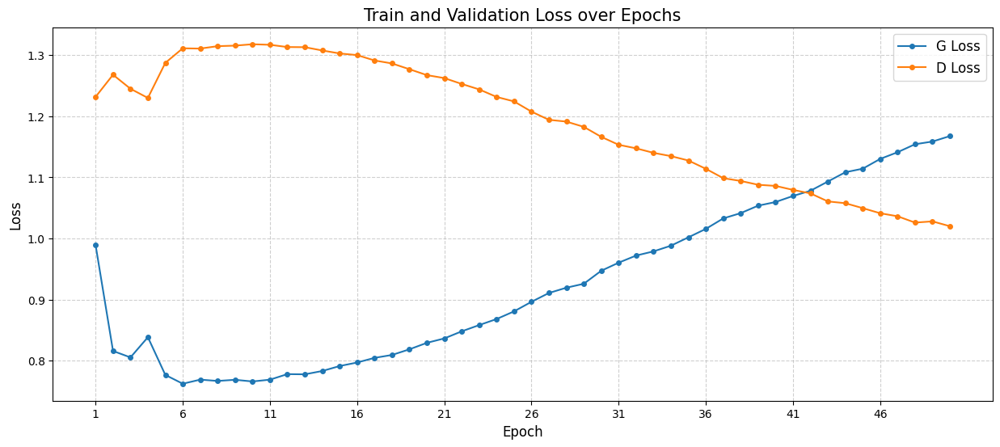

In [23]:
plt.style.use('default')
plt.figure(figsize=(15, 6))
plt.plot(range(1,51), [r['g_loss'] for r in history], label='G Loss', marker='o', markersize=4)
plt.plot(range(1,51), [r['d_loss'] for r in history], label='D Loss', marker='o', markersize=4)
plt.title("Train and Validation Loss over Epochs", fontsize=15)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.xticks(range(1,51,5))
plt.legend(fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# 4. Generate Image

In [24]:
noise = tf.random.normal([5, generator_model.input_shape[1]])

gen_imgs = generator_model.predict(noise, verbose=0)
gen_imgs = ((gen_imgs + 1) * 127.5).astype(np.uint8)

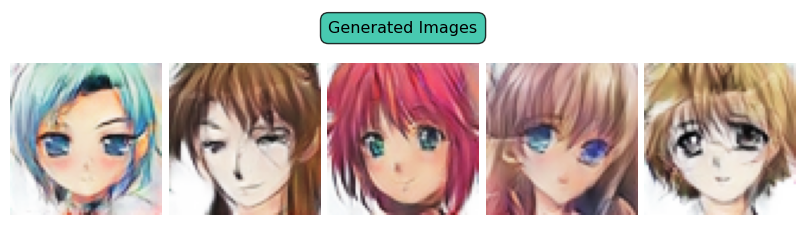

In [25]:
fig = plt.figure(figsize=(8, 2.5))
gs = GridSpec(2, 5, height_ratios=[0.15, 0.85])

title_ax = fig.add_subplot(gs[0, :])
title_ax.text(0.5, 0.5, "Generated Images",
              fontsize=11.5, ha='center', va='center',
              bbox=dict(facecolor='#1ABC9C', edgecolor='black', 
                        boxstyle='round,pad=0.5', alpha=0.8))
title_ax.axis('off')

for i in range(5):
    ax = fig.add_subplot(gs[1, i])
    ax.imshow(gen_imgs[i])
    ax.axis('off')

plt.tight_layout(pad=0.5)
plt.show()